In [7]:
# Install Libraries
!pip install textblob
!pip install tweepy
!pip install pycountry
!pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 981 kB 18.9 MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993242 sha256=3f70d6b0f63dfa6c0aa1189ff0af8ec72431da42069cd771a60a6d228fe5a5a4
  Stored in directory: /root/.cache/pip/wheels/c5/96/8a/f90c59ed25d75e50a8c10a1b1c2d4c402e4dacfa87f3aff36a
Successfully built langdetect


In [8]:
# Import Libraries

from textblob import TextBlob
import sys
import tweepy
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import nltk
import pycountry
import re
import string

from wordcloud import WordCloud, STOPWORDS
from PIL import Image
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from langdetect import detect
from nltk.stem import SnowballStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer

In [11]:
# Authentication
consumerKey = "xxx"
consumerSecret = "xxx"
accessToken = "xxx-xxx"
accessTokenSecret = "xx"

auth = tweepy.OAuthHandler(consumerKey, consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret)
api = tweepy.API(auth)

In [13]:
#Sentiment Analysis
import nltk
nltk.downloader.download('vader_lexicon')

def percentage(part,whole):
    return 100 * float(part)/float(whole) 

keyword = input("Please enter keyword or hashtag to search: ")
noOfTweet = int(input ("Please enter how many tweets to analyze: "))


tweets = tweepy.Cursor(api.search, q=keyword).items(noOfTweet)
positive  = 0
negative = 0
neutral = 0
polarity = 0
tweet_list = []
neutral_list = []
negative_list = []
positive_list = []

for tweet in tweets:
    
    #print(tweet.text)
    tweet_list.append(tweet.text)
    analysis = TextBlob(tweet.text)
    score = SentimentIntensityAnalyzer().polarity_scores(tweet.text)
    neg = score['neg']
    neu = score['neu']
    pos = score['pos']
    comp = score['compound']
    polarity += analysis.sentiment.polarity
    
    if neg > pos:
        negative_list.append(tweet.text)
        negative += 1

    elif pos > neg:
        positive_list.append(tweet.text)
        positive += 1
    
    elif pos == neg:
        neutral_list.append(tweet.text)
        neutral += 1

positive = percentage(positive, noOfTweet)
negative = percentage(negative, noOfTweet)
neutral = percentage(neutral, noOfTweet)
polarity = percentage(polarity, noOfTweet)
positive = format(positive, '.1f')
negative = format(negative, '.1f')
neutral = format(neutral, '.1f')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


Please enter keyword or hashtag to search: playstation
Please enter how many tweets to analyze: 250


In [14]:
#Number of Tweets (Total, Positive, Negative, Neutral)
tweet_list = pd.DataFrame(tweet_list)
neutral_list = pd.DataFrame(neutral_list)
negative_list = pd.DataFrame(negative_list)
positive_list = pd.DataFrame(positive_list)
print("total number: ",len(tweet_list))
print("positive number: ",len(positive_list))
print("negative number: ", len(negative_list))
print("neutral number: ",len(neutral_list))

total number:  250
positive number:  67
negative number:  25
neutral number:  158


In [15]:
tweet_list

,0
0,RT @Gilbertbelieve2: PlayStation is about to h...
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...
...,...
245,RT @Rainbow6JP: 【6月19日 20:00 開催🎉】\nPlayStation...
246,Look who’s ready to add a splash of colour to ...
247,RT @BitaminRuki518: Giving away 1000 V BUCKS t...
248,RT @poliwar_93: No entiendo como puede haber g...


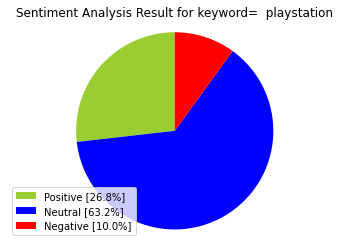

In [16]:
#Creating PieCart

labels = ['Positive ['+str(positive)+'%]' , 'Neutral ['+str(neutral)+'%]','Negative ['+str(negative)+'%]']
sizes = [positive, neutral, negative]
colors = ['yellowgreen', 'blue','red']
patches, texts = plt.pie(sizes,colors=colors, startangle=90)
plt.style.use('default')
plt.legend(labels)
plt.title("Sentiment Analysis Result for keyword=  "+keyword+"" )
plt.axis('equal')
plt.show()

In [17]:
tweet_list.drop_duplicates(inplace = True)

#Extracting text values
text_all = tweet_list[0].values
text_neutral = neutral_list[0].values
text_positive = positive_list[0].values
text_negative = negative_list[0].values

In [18]:
tw_list = pd.DataFrame(tweet_list)
tw_list["text"] = tw_list[0]
tw_list

,0,text
0,RT @Gilbertbelieve2: PlayStation is about to h...,RT @Gilbertbelieve2: PlayStation is about to h...
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...
...,...,...
243,えぺ楽しい #PS4share\n\nhttps://t.co/xOg5MvWRSA htt...,えぺ楽しい #PS4share\n\nhttps://t.co/xOg5MvWRSA htt...
245,RT @Rainbow6JP: 【6月19日 20:00 開催🎉】\nPlayStation...,RT @Rainbow6JP: 【6月19日 20:00 開催🎉】\nPlayStation...
246,Look who’s ready to add a splash of colour to ...,Look who’s ready to add a splash of colour to ...
247,RT @BitaminRuki518: Giving away 1000 V BUCKS t...,RT @BitaminRuki518: Giving away 1000 V BUCKS t...


In [19]:
tweet_list

,0,text
0,RT @Gilbertbelieve2: PlayStation is about to h...,RT @Gilbertbelieve2: PlayStation is about to h...
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...
...,...,...
243,えぺ楽しい #PS4share\n\nhttps://t.co/xOg5MvWRSA htt...,えぺ楽しい #PS4share\n\nhttps://t.co/xOg5MvWRSA htt...
245,RT @Rainbow6JP: 【6月19日 20:00 開催🎉】\nPlayStation...,RT @Rainbow6JP: 【6月19日 20:00 開催🎉】\nPlayStation...
246,Look who’s ready to add a splash of colour to ...,Look who’s ready to add a splash of colour to ...
247,RT @BitaminRuki518: Giving away 1000 V BUCKS t...,RT @BitaminRuki518: Giving away 1000 V BUCKS t...


In [20]:
#Cleaning Text (RT, Punctuation etc)

#Creating new dataframe and new features
tw_list = pd.DataFrame(tweet_list)
tw_list["text"] = tw_list[0]

#Removing RT, Punctuation etc
remove_rt = lambda x: re.sub('RT @\w+: '," ",x)
rt = lambda x: re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x)
tw_list["text"] = tw_list.text.map(remove_rt).map(rt)
tw_list["text"] = tw_list.text.str.lower()
tw_list.head(10)

,0,text
0,RT @Gilbertbelieve2: PlayStation is about to h...,playstation is about to have a spectacular 20...
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...,friendly reminder dnf duel will be releasin...
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...,playstation 4 ps4live minec...
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...,crisis core final fantasy vii reunion comi...
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...,
5,@nosleep1138 Especially when the PC version is...,especially when the pc version isn t even on...
6,NFL Blitz Pro for the Sony PlayStation 2.\n\n#...,nfl blitz pro for the sony playstation 2 re...
7,今回の大型アプデで追加された（ミラージュ）ミランを使ってみた。\n格納式カナードがついた変態...,...
8,#PS4share\n\nhttps://t.co/roumv2p0ee https://t...,ps4share
9,what fucking game do you think we're playing x...,what fucking game do you think we re playing x...


In [21]:
#Calculating Negative, Positive, Neutral and Compound values

tw_list[['polarity', 'subjectivity']] = tw_list['text'].apply(lambda Text: pd.Series(TextBlob(Text).sentiment))
for index, row in tw_list['text'].iteritems():
    score = SentimentIntensityAnalyzer().polarity_scores(row)
    neg = score['neg']
    neu = score['neu']
    pos = score['pos']
    comp = score['compound']
    if neg > pos:
        tw_list.loc[index, 'sentiment'] = "negative"
    elif pos > neg:
        tw_list.loc[index, 'sentiment'] = "positive"
    else:
        tw_list.loc[index, 'sentiment'] = "neutral"
    tw_list.loc[index, 'neg'] = neg
    tw_list.loc[index, 'neu'] = neu
    tw_list.loc[index, 'pos'] = pos
    tw_list.loc[index, 'compound'] = comp

tw_list.head(10)

,0,text,polarity,subjectivity,sentiment,neg,neu,pos,compound
0,RT @Gilbertbelieve2: PlayStation is about to h...,playstation is about to have a spectacular 20...,0.600000,0.9,neutral,0.000,1.000,0.000,0.0000
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...,friendly reminder dnf duel will be releasin...,0.375000,0.5,positive,0.000,0.842,0.158,0.4939
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...,playstation 4 ps4live minec...,0.136364,0.5,neutral,0.000,1.000,0.000,0.0000
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...,crisis core final fantasy vii reunion comi...,0.000000,1.0,negative,0.204,0.796,0.000,-0.6249
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...,,0.000000,0.0,neutral,0.000,0.000,0.000,0.0000
5,@nosleep1138 Especially when the PC version is...,especially when the pc version isn t even on...,0.000000,1.0,neutral,0.000,1.000,0.000,0.0000
6,NFL Blitz Pro for the Sony PlayStation 2.\n\n#...,nfl blitz pro for the sony playstation 2 re...,0.000000,0.0,neutral,0.000,1.000,0.000,0.0000
7,今回の大型アプデで追加された（ミラージュ）ミランを使ってみた。\n格納式カナードがついた変態...,...,0.000000,0.0,neutral,0.000,0.000,0.000,0.0000
8,#PS4share\n\nhttps://t.co/roumv2p0ee https://t...,ps4share,0.000000,0.0,neutral,0.000,1.000,0.000,0.0000
9,what fucking game do you think we're playing x...,what fucking game do you think we re playing x...,-0.400000,0.4,positive,0.000,0.833,0.167,0.2023


In [22]:
#Creating new data frames for all sentiments (positive, negative and neutral)

tw_list_negative = tw_list[tw_list["sentiment"]=="negative"]
tw_list_positive = tw_list[tw_list["sentiment"]=="positive"]
tw_list_neutral = tw_list[tw_list["sentiment"]=="neutral"]

In [23]:
#Function for count_values_in single columns

def count_values_in_column(data,feature):
    total=data.loc[:,feature].value_counts(dropna=False)
    percentage=round(data.loc[:,feature].value_counts(dropna=False,normalize=True)*100,2)
    return pd.concat([total,percentage],axis=1,keys=['Total','Percentage'])

In [24]:
#Count_values for sentiment
count_values_in_column(tw_list,"sentiment")

,Total,Percentage
neutral,138,61.88
positive,58,26.01
negative,27,12.11


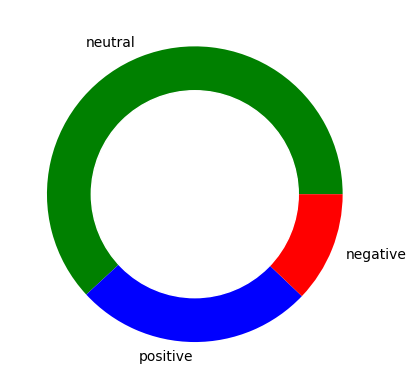

In [31]:
# create data for Pie Chart
pc = count_values_in_column(tw_list,"sentiment")
names= pc.index
size=pc["Percentage"]
 
# Create a circle for the center of the plot
my_circle=plt.Circle( (0,0), 0.7, color='white')
plt.pie(size, labels=names, colors=['green','blue','red'])
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.show()

In [36]:
#Function to Create Wordcloud
from google.colab import drive
drive.mount('/content/drive')

def create_wordcloud(text):
    mask = np.array(Image.open("/content/drive/MyDrive/analysis/cloud.png"))
    stopwords = set(STOPWORDS)
    wc = WordCloud(background_color="white",
                  mask = mask,
                  max_words=3000,
                  stopwords=stopwords,
                  repeat=True)
    wc.generate(str(text))
    wc.to_file("wc.png")
    print("Word Cloud Saved Successfully")
    path="wc.png"
    display(Image.open(path))

Mounted at /content/drive


Word Cloud Saved Successfully


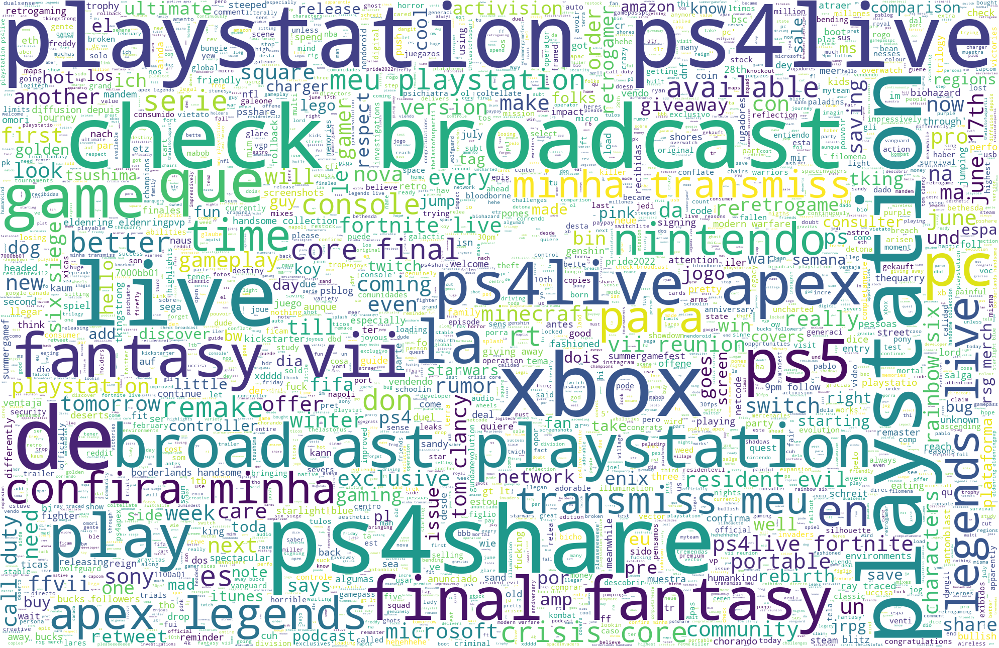

In [37]:
#Creating wordcloud for all tweets
create_wordcloud(tw_list["text"].values)

Word Cloud Saved Successfully


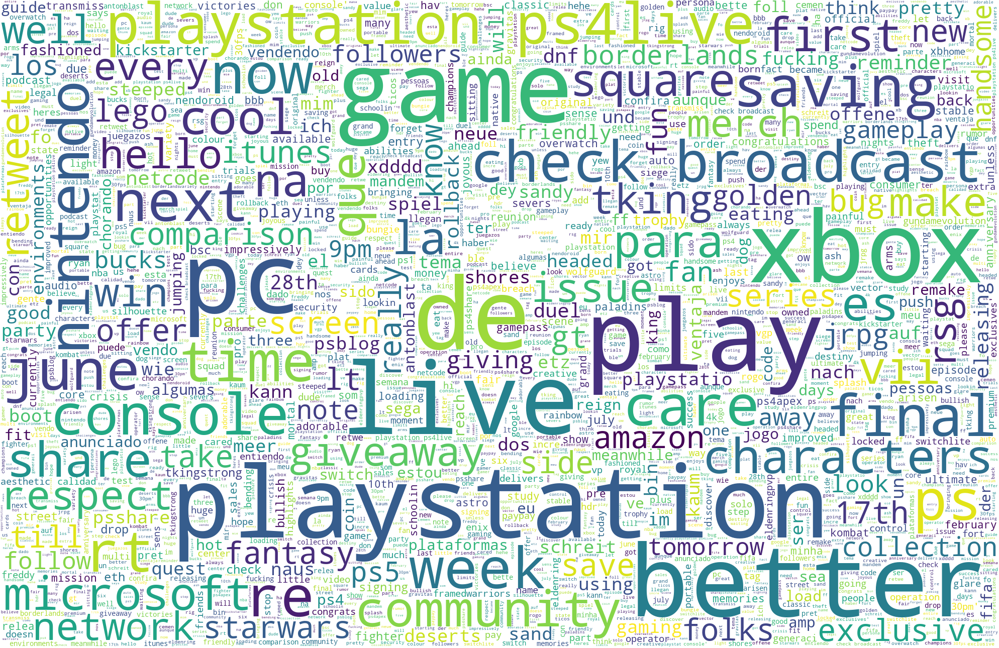

In [38]:
#Creating wordcloud for positive sentiment
create_wordcloud(tw_list_positive["text"].values)

Word Cloud Saved Successfully


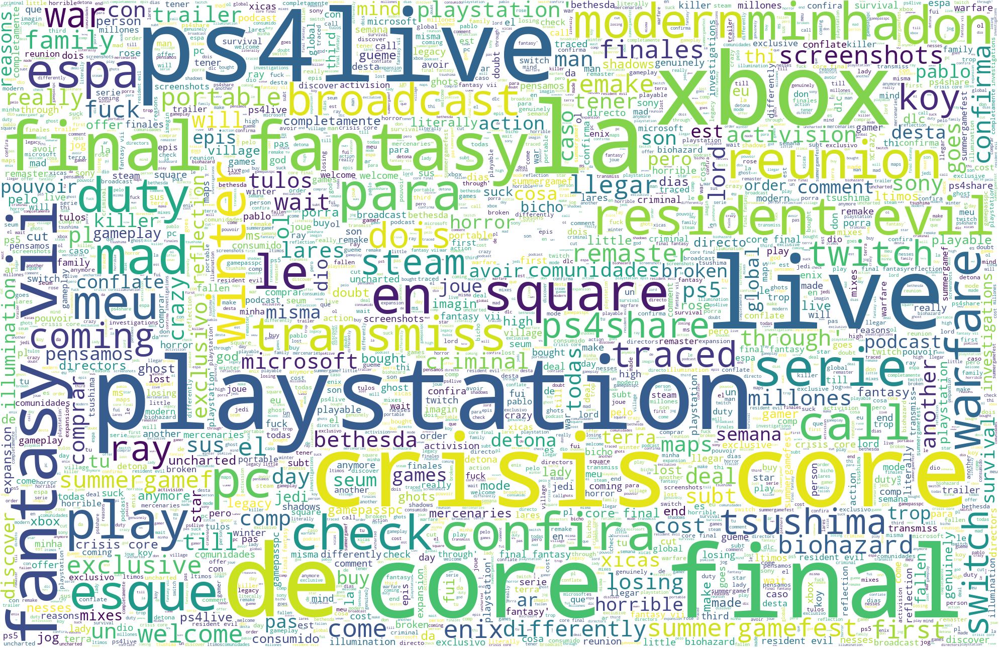

In [39]:
#Creating wordcloud for negative sentiment
create_wordcloud(tw_list_negative["text"].values)

Word Cloud Saved Successfully


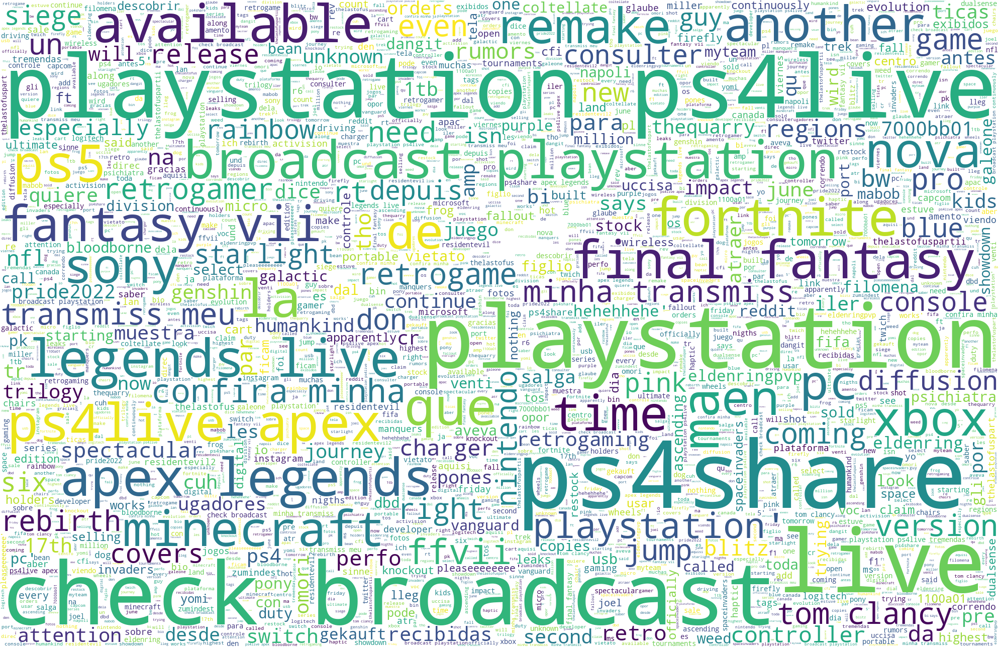

In [40]:
#Creating wordcloud for neutral sentiment
create_wordcloud(tw_list_neutral["text"].values)

In [41]:
#Calculating tweet's lenght and word count
tw_list['text_len'] = tw_list['text'].astype(str).apply(len)
tw_list['text_word_count'] = tw_list['text'].apply(lambda x: len(str(x).split()))

In [42]:
round(pd.DataFrame(tw_list.groupby("sentiment").text_len.mean()),2)

,text_len
sentiment,
negative,95.96
neutral,51.09
positive,100.21


In [43]:
round(pd.DataFrame(tw_list.groupby("sentiment").text_word_count.mean()),2)

,text_word_count
sentiment,
negative,15.81
neutral,6.20
positive,16.97


In [44]:
#Removing Punctuation
def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text

tw_list['punct'] = tw_list['text'].apply(lambda x: remove_punct(x))

In [45]:
#Appliyng tokenization
def tokenization(text):
    text = re.split('\W+', text)
    return text

tw_list['tokenized'] = tw_list['punct'].apply(lambda x: tokenization(x.lower()))

In [47]:
import nltk
nltk.download('stopwords')

#Removing stopwords
stopword = nltk.corpus.stopwords.words('english')
def remove_stopwords(text):
    text = [word for word in text if word not in stopword]
    return text
    
tw_list['nonstop'] = tw_list['tokenized'].apply(lambda x: remove_stopwords(x))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [48]:
#Appliyng Stemmer
ps = nltk.PorterStemmer()

def stemming(text):
    text = [ps.stem(word) for word in text]
    return text

tw_list['stemmed'] = tw_list['nonstop'].apply(lambda x: stemming(x))

In [49]:
#Cleaning Text
def clean_text(text):
    text_lc = "".join([word.lower() for word in text if word not in string.punctuation]) # remove puntuation
    text_rc = re.sub('[0-9]+', '', text_lc)
    tokens = re.split('\W+', text_rc)    # tokenization
    text = [ps.stem(word) for word in tokens if word not in stopword]  # remove stopwords and stemming
    return text

In [50]:
tw_list.head()

,0,text,polarity,subjectivity,sentiment,neg,neu,pos,compound,text_len,text_word_count,punct,tokenized,nonstop,stemmed
0,RT @Gilbertbelieve2: PlayStation is about to h...,playstation is about to have a spectacular 20...,0.600000,0.9,neutral,0.000,1.000,0.000,0.0000,57,9,playstation is about to have a spectacular ...,"[, playstation, is, about, to, have, a, specta...","[, playstation, spectacular, ps, ]","[, playstat, spectacular, ps, ]"
1,RT @FGC_Daily: ⏳FRIENDLY REMINDER: DNF Duel wi...,friendly reminder dnf duel will be releasin...,0.375000,0.5,positive,0.000,0.842,0.158,0.4939,126,18,friendly reminder dnf duel will be releasin...,"[, friendly, reminder, dnf, duel, will, be, re...","[, friendly, reminder, dnf, duel, releasing, j...","[, friendli, remind, dnf, duel, releas, june, ..."
2,PlayStation 4からブロードキャストを始めました！ #PS4live (Minec...,playstation 4 ps4live minec...,0.136364,0.5,neutral,0.000,1.000,0.000,0.0000,62,6,playstation pslive minecra...,"[playstation, pslive, minecraft, live, at, ]","[playstation, pslive, minecraft, live, ]","[playstat, pslive, minecraft, live, ]"
3,RT @geoffkeighley: CRISIS CORE: FINAL FANTASY ...,crisis core final fantasy vii reunion comi...,0.000000,1.0,negative,0.204,0.796,0.000,-0.6249,122,17,crisis core final fantasy vii reunion comi...,"[, crisis, core, final, fantasy, vii, reunion,...","[, crisis, core, final, fantasy, vii, reunion,...","[, crisi, core, final, fantasi, vii, reunion, ..."
4,このイベントで最も今までにない優しい世界線なのかもしれない\n\nhttps://t.co/...,,0.000000,0.0,neutral,0.000,0.000,0.000,0.0000,34,0,,"[, ]","[, ]","[, ]"


In [51]:
#Appliyng Countvectorizer
countVectorizer = CountVectorizer(analyzer=clean_text) 
countVector = countVectorizer.fit_transform(tw_list['text'])
print('{} Number of reviews has {} words'.format(countVector.shape[0], countVector.shape[1]))
#print(countVectorizer.get_feature_names())

223 Number of reviews has 776 words


In [52]:
count_vect_df = pd.DataFrame(countVector.toarray(), columns=countVectorizer.get_feature_names())
count_vect_df.head()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,,aber,abil,action,activis,add,ador,aesthet,ahead,ainda,...,www,x,xb,xbox,xdddd,xica,yew,yo,yomi,zumindest
0,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
4,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [53]:
# Most Used Words
count = pd.DataFrame(count_vect_df.sum())
countdf = count.sort_values(0,ascending=False).head(20)
countdf[1:11]

,0
playstat,89
psshare,58
pslive,35
live,35
xbox,19
check,17
de,16
broadcast,16
ps,15
final,13


In [54]:
#Function to ngram
def get_top_n_gram(corpus,ngram_range,n=None):
    vec = CountVectorizer(ngram_range=ngram_range,stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

In [55]:
#n2_bigram
n2_bigrams = get_top_n_gram(tw_list['text'],(2,2),20)

n2_bigrams

[('playstation ps4live', 35),
 ('check broadcast', 16),
 ('broadcast playstation', 16),
 ('final fantasy', 11),
 ('fantasy vii', 9),
 ('ps4live apex', 8),
 ('apex legends', 8),
 ('legends live', 8),
 ('confira minha', 6),
 ('minha transmiss', 6),
 ('transmiss meu', 6),
 ('meu playstation', 6),
 ('crisis core', 5),
 ('core final', 5),
 ('ps4live fortnite', 5),
 ('fortnite live', 5),
 ('vii reunion', 4),
 ('playstation xbox', 4),
 ('resident evil', 4),
 ('ps4live minecraft', 3)]

In [56]:
#n3_trigram
n3_trigrams = get_top_n_gram(tw_list['text'],(3,3),20)

n3_trigrams

[('check broadcast playstation', 16),
 ('broadcast playstation ps4live', 16),
 ('final fantasy vii', 9),
 ('playstation ps4live apex', 8),
 ('ps4live apex legends', 8),
 ('apex legends live', 8),
 ('confira minha transmiss', 6),
 ('minha transmiss meu', 6),
 ('transmiss meu playstation', 6),
 ('meu playstation ps4live', 6),
 ('crisis core final', 5),
 ('core final fantasy', 5),
 ('playstation ps4live fortnite', 5),
 ('ps4live fortnite live', 5),
 ('fantasy vii reunion', 4),
 ('playstation ps4live minecraft', 3),
 ('ps4live minecraft live', 3),
 ('playstation ps4live tom', 3),
 ('ps4live tom clancy', 3),
 ('fantasy vii rebirth', 2)]